## SInCohMap Sentinel-2 data access and processing examples
### Author michele.claus@eurac.edu
### Date: 2022/01/13

## Useful links:

SAR2Cube website: https://sar2cube.projects.eurac.edu/

openEO main website: https://openeo.org/

openEO Python Client documentation: https://open-eo.github.io/openeo-python-client/index.html

Getting started guide for openEO with python: https://openeo.org/documentation/1.0/python/

## Topics:
- Login to Eurac's openEO backend containing the SInCohMap datacubes
- Discover the data sets and processes
- Access and process data via openEO processes
- Common use cases for optical data:
    - Create and apply a cloud mask
    - Create a cloud free median composite
    - Mask out the clouds and compute the monthly mean NDVI

### Import all the libraries and utilities functions included in the eo_utils.py file

In [1]:
from eo_utils import *

### Connect and login

In [2]:
openeoHost = "https://openeo.eurac.edu"
conn = openeo.connect(openeoHost).authenticate_oidc(client_id="openEO_PKCE")

Authenticated using refresh token.


Please check to have the latest openeo library. openeo >= 0.9.0 is required

In [3]:
openeo.__version__

'0.9.1'

### Get the info of our account:

In [20]:
conn.describe_account()

{'user_id': 'dfd05cf2-30d1-4139-9cda-493787936318',
 'name': 'MIchele Claus',
 'links': None}

### Discover the available collections:

In [106]:
conn.list_collections()

[{'stac_version': '0.9.0',
  'stac_extensions': ['datacube', 'scientific'],
  'id': 'ADO_CORINE_100m_3035_ODC',
  'title': 'Corine Land Cover (CLC) 2018',
  'description': 'CLC2018 is one of the Corine Land Cover (CLC) datasets produced within the frame the Copernicus Land Monitoring Service referring to land cover / land use status of year 2018. CLC service has a long-time heritage (formerly known as "CORINE Land Cover Programme"), coordinated by the European Environment Agency (EEA). It provides consistent and thematically detailed information on land cover and land cover changes across Europe.',
  'keywords': ['Copernicus',
   'Land',
   'Satellite Image Interpretation',
   '2018',
   'Corine',
   'Corine Land Cover'],
  'version': 'v1',
  'deprecated': False,
  'license': 'CC-BY-4.0',
  'sci:citation': 'Copyright holder: European Environment Agency (EEA)',
  'providers': [{'name': 'Eurac EO ODC',
    'url': 'https://www.eurac.edu',
    'roles': ['host']},
   {'name': 'European Environment Agency (EEA)',
    'url': 'mailto:copernicus@eea.europa.eu',
    'roles': ['producer']}],
  'extent': {'spatial': {'bbox': [[3.097476122153762,
      42.49699937418966,
      17.50687107025045,
      50.35760819184301]]},
   'temporal': {'interval': [['2018-01-01T23:59:00Z',
      '2018-01-01T23:59:00Z']]}},
  'links': [{'rel': 'licence',
    'href': 'https://creativecommons.org/licenses/by/4.0/',
    'type': 'text/html',
    'title': 'License Link'}],
  'cube:dimensions': {'DATE': {'type': 'temporal',
    'extent': ['2018-01-01T23:59:00+00:00', '2018-01-01T23:59:00+00:00']},
   'X': {'type': 'spatial',
    'axis': 'x',
    'extent': [3.097476122153762, 17.50687107025045],
    'reference_system': 3035},
   'Y': {'type': 'spatial',
    'axis': 'y',
    'extent': [42.49699937418966, 50.35760819184301],
    'reference_system': 3035},
   'bands': {'type': 'bands', 'values': ['CLC2018_WM']}},
  'summaries': {'rows': 8332, 'columns': 10240, 'gsd': [100.0]}},
 {'stac_version': '0.9.0',
  'stac_extensions': ['datacube'],
  'id': 'ADO_NDVI_MODIS_231m_3035_ODC',
  'title': 'ADO_NDVI_MODIS_231m_3035_ODC',
  'description': 'ADO_NDVI_MODIS_231m_3035_ODC',
  'deprecated': False,
  'license': 'CC-BY-4.0',
  'providers': [{'name': 'Eurac EO ODC',
    'url': 'http://www.eurac.edu/',
    'roles': ['producer', 'host']}],
  'extent': {'spatial': {'bbox': [[3.5446677656937715,
      42.28250560234868,
      18.990556343370127,
      48.77837603135202]]},
   'temporal': {'interval': [['2000-02-25T23:59:00Z',
      '2020-11-11T23:59:00Z']]}},
  'links': [{'rel': 'license',
    'href': 'https://creativecommons.org/licenses/by/4.0/',
    'type': 'text/html',
    'title': 'License link'}],
  'cube:dimensions': {'DATE': {'type': 'temporal',
    'extent': ['2000-02-25T23:59:00+00:00', '2020-11-11T23:59:00+00:00']},
   'X': {'type': 'spatial',
    'axis': 'x',
    'extent': [3.5446677656937715, 18.990556343370127],
    'reference_system': 3035},
   'Y': {'type': 'spatial',
    'axis': 'y',
    'extent': [42.28250560234868, 48.77837603135202],
    'reference_system': 3035},
   'bands': {'type': 'bands', 'values': ['QA', 'DOY', 'NDVI', 'PLATFORM']}}},
 {'stac_version': '0.9.0',
  'stac_extensions': ['datacube'],
  'id': 'Backscatter_Sentinel1_Track015',
  'title': 'Backscatter_Sentinel1_Track015',
  'description': 'Sentinel-1 Data',
  'deprecated': False,
  'license': 'CC-BY-4.0',
  'providers': [{'name': 'Eurac EO ODC',
    'url': 'http://www.eurac.edu/',
    'roles': ['producer', 'host']}],
  'extent': {'spatial': {'bbox': [[6.568274408568806,
      43.36699117383023,
      11.94569379468819,
      48.09694046058147]]},
   'temporal': {'interval': [['2014-11-11T17:15:03Z',
      '2016-09-25T17:15:19Z']]}},
  'links': [{'rel': 'license',
    'href': 'https://creativecommons.org/licenses/by/4.0/',
    'type': 'text/html',
    'title': 'License link'}],
  'cube:dimensions': {'DATE': {'type': 'temporal',
    'extent': ['2014-11-11T17:15:03+00:00', '2016-09-25T17:15:19+00

### Discover the available processes:

In [6]:
conn.list_processes()

[{'engine': '[ODC_DASK]',
  'id': 'dimension_labels',
  'summary': 'Get the dimension labels',
  'description': 'Returns all labels for a dimension in the data cube. The labels have the same order as in the data cube.',
  'parameters': [{'schema': {'subtype': 'raster-cube', 'type': 'object'},
    'name': 'data',
    'description': 'The data cube.'},
   {'schema': {'type': 'string'},
    'name': 'dimension',
    'description': 'The name of the dimension to get the labels for.'}],
  'categories': ['cubes'],
  'returns': {'schema': {'type': 'array',
    'items': {'anyOf': [{'type': 'number'}, {'type': 'string'}]}},
   'description': 'The labels as array.'},
  'exceptions': {}},
 {'engine': '[WCPS, ODC_DASK]',
  'id': 'ln',
  'summary': 'Natural logarithm',
  'description': 'The natural logarithm is the logarithm to the base *e* of the number `x`, which equals to using the *log* process with the base set to *e*. The natural logarithm is the inverse function of taking *e* to the power x.\n\nThe no-data value `null` is passed through.\n\nThe computations follow [IEEE Standard 754](https://ieeexplore.ieee.org/document/8766229) whenever the processing environment supports it. Therefore, `ln(0)` results in ±infinity if the processing environment supports it or otherwise an error is thrown.',
  'parameters': [{'schema': {'type': ['number', 'null']},
    'name': 'x',
    'description': 'A number to compute the natural logarithm for.'}],
  'categories': ['math > exponential & logarithmic'],
  'links': [{'rel': 'about',
    'href': 'http://mathworld.wolfram.com/NaturalLogarithm.html',
    'title': 'Natural logarithm explained by Wolfram MathWorld'},
   {'rel': 'about',
    'href': 'https://ieeexplore.ieee.org/document/8766229',
    'title': 'IEEE Standard 754-2019 for Floating-Point Arithmetic'}],
  'returns': {'schema': {'type': ['number', 'null']},
   'description': 'The computed natural logarithm.'},
  'exceptions': {},
  'examples': [{'arguments': {'x': 1}, 'returns': 0}]},
 {'engine': '[ODC_DASK]',
  'id': 'coherence',
  'summary': 'Compute the complex coherence with SAR data',
  'description': 'Compute the complex coherence with SAR data, given the specified time delta.',
  'parameters': [{'schema': {'subtype': 'raster-cube', 'type': 'object'},
    'name': 'data',
    'description': 'A raster data cube with exactly two horizontal spatial dimensions and an arbitrary number of additional dimensions. The process is applied to all additional dimensions individually.'},
   {'schema': {'type': 'integer',
     'enum': [6, 12, 18, 24, 30, 36, 42, 48, 54, 60, 66, 72, 78, 84, 90, 96]},
    'default': '6',
    'name': 'timedelta',
    'description': 'Temporal delta in days between acquisitions on which we want to compute coherence.',
    'optional': True}],
  'categories': ['cubes', 'math'],
  'returns': {'schema': {'subtype': 'raster-cube', 'type': 'object'},
   'description': 'A data cube with the projected values in the requested projection.'},
  'exceptions': {}},
 {'engine': '[WCPS]',
  'id': 'cos',
  'summary': 'Cosine',
  'description': 'Computes the cosine of `x`.\n\nWorks on radians only.\nThe no-data value `null` is passed through and therefore gets propagated.',
  'parameters': [{'schema': {'type': ['number', 'null']},
    'name': 'x',
    'description': 'An angle in radians.'}],
  'categories': ['math > trigonometric'],
  'links': [{'rel': 'about',
    'href': 'http://mathworld.wolfram.com/Cosine.html',
    'title': 'Cosine explained by Wolfram MathWorld'}],
  'returns': {'schema': {'type': ['number', 'null']},
   'description': 'The computed cosine of `x`.'},
  'exceptions': {},
  'examples': [{'arguments': {'x': 0}, 'returns': 1}]},
 {'engine': '[WCPS, ODC_DASK]',
  'id': 'lt',
  'summary': 'Less than comparison',
  'description': 'Compares whether `x` is strictly less than `y`.\n\n**Remarks:**\n\n* If any operand is `null`, the return value is `null`.\n* If any operand is an array or object, the return value is `false`.\n* If any

## Select the AOI
Use the rectangle selection tool to select the area of interest

In [32]:
center = [37.2, -6.2]
zoom = 9

eoMap = openeoMap(center,zoom)
eoMap.map

Map(center=[37.2, -6.2], controls=(ZoomControl(options=['position', 'zoom_in_text', 'zoom_in_title', 'zoom_out…

In [46]:
bbox = eoMap.getBbox()
print("Coordinates selected from map:",'\n west',bbox[0],'\n east',bbox[2],'\n south',bbox[1],'\n north',bbox[3])

Coordinates selected from map: 
 west -6.048682 
 east -6.044734 
 south 37.196675 
 north 37.19888


In [47]:
spatial_extent  = {'west':bbox[0],'east':bbox[2],'south':bbox[1],'north':bbox[3]}

In [48]:
spatial_extent

{'west': -6.048682, 'east': -6.044734, 'south': 37.196675, 'north': 37.19888}

## Doñana Datacubes:

### Sentinel-1:

SAR2Cube_SInCohMap_S1_L0_147_ASC_DONYANA

SAR2Cube_SInCohMap_S1_L0_154_DSC_DONYANA

### Sentinel-2:

SInCohMap_S2_L1C_T29SQB

# Optical processing

## Create and apply a cloud mask

### Original data

**Please Note: There is an issue with OpenDatacube and queries along the antimeridian.**

**A workaround consist in filtering the data spatially using filter_bbox instead of setting the spatial extent inside load_collection.**

In [49]:
conn = openeo.connect(openeoHost).authenticate_oidc(client_id="openEO_PKCE")

collection      = 'SInCohMap_S2_L1C_T29SQB'
temporal_extent = ['2020-10-23T00:00:00.000Z', '2020-10-24T23:59:00.000Z']
bands = ['B02','B03','B04']
S2_L1C = conn.load_collection(collection,temporal_extent=temporal_extent,bands=bands).filter_bbox(spatial_extent)

# We take the mean over time. In this case there is just one day, so we just remove the temporal dimension.
S2_L1C = S2_L1C.reduce_dimension(reducer=mean,dimension='DATE')

# We take the average over windows of 10x10 pixels, wich means we increase the pixel footprint from 10m to 100m, reducing the output file size for a quick preview.
args_aggregate_spatial_window = {"data": THIS, "boundary": "trim", "size": [10,10],"reducer":S2_L1C._get_callback(mean,parent_parameters=["data"])}
S2_L1C_100m = S2_L1C.process("aggregate_spatial_window",args_aggregate_spatial_window)

# We rescale the data between 0 and 255 for the PNG format.
S2_L1C_100m_PNG = S2_L1C_100m.linear_scale_range(0,2000,0,255)

Authenticated using refresh token.


In [37]:
S2_L1C_100m_PNG.download("./data/S2_L1C.png",format='PNG')

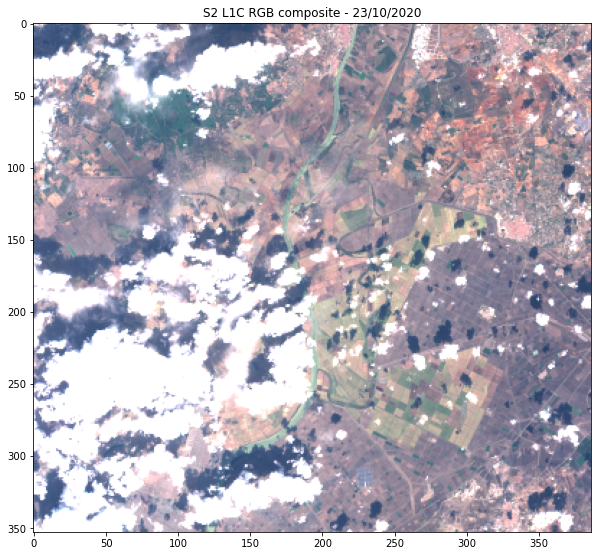

In [12]:
plot_args = {'cmap':'brg'}
fig, ax = plt.subplots(1,1,figsize=(10,10))
im = plt.imread("./data/S2_L1C.png")
ax.set_title("S2 L1C RGB composite - 23/10/2020")
ax.imshow(im,**plot_args)
plt.show()

### Cloud masked data

In [13]:
conn = openeo.connect(openeoHost).authenticate_oidc(client_id="openEO_PKCE")

collection      = 'SInCohMap_S2_L1C_T29SQB'
temporal_extent = ['2020-10-23T00:00:00.000Z', '2020-10-24T23:59:00.000Z']
bands = ['B02','B03','B04','FMASK']
S2_L1C = conn.load_collection(collection,temporal_extent=temporal_extent,bands=bands).filter_bbox(spatial_extent)

# We take the mean over time. In this case there is just one day, so we just remove the temporal dimension.
S2_L1C = S2_L1C.reduce_dimension(reducer=mean,dimension='DATE')

# We create a mask for clouds (FMASK == 4) and cloud shadows (FMASK == 2).
cloud_mask = S2_L1C.filter_bands('FMASK').reduce_dimension(dimension="bands",reducer = lambda value: or_(eq(array_element(value,0),2),eq(array_element(value,0),4)))

# We apply the mask to the RGB bands:
S2_L1C_masked = S2_L1C.filter_bands(['B02','B03','B04']).mask(cloud_mask)

# We take the average over windows of 10x10 pixels, wich means we increase the pixel footprint from 10m to 100m, reducing the output file size for a quick preview.
args_aggregate_spatial_window = {"data": THIS, "boundary": "trim", "size": [10,10],"reducer":S2_L1C_masked._get_callback(mean,parent_parameters=["data"])}
S2_L1C_100m = S2_L1C_masked.process("aggregate_spatial_window",args_aggregate_spatial_window)

# We rescale the data between 0 and 255 for the PNG format.
S2_L1C_100m_PNG = S2_L1C_100m.linear_scale_range(0,2000,0,255)

In [14]:
%%time
# We download the result as a PNG
S2_L1C_100m_PNG.download("./data/S2_L1C_masked.png",format='PNG')

CPU times: user 14.3 ms, sys: 399 µs, total: 14.7 ms
Wall time: 11.8 s


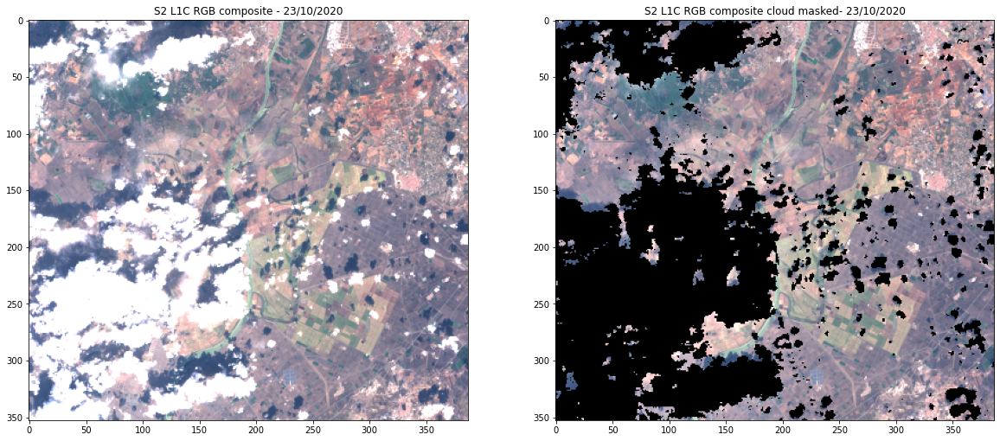

In [15]:
plot_args = {'cmap':'brg'}
fig, ax = plt.subplots(1,2,figsize=(20,10))
ax[0].imshow(im,**plot_args)
ax[0].set_title("S2 L1C RGB composite - 23/10/2020")
im2 = plt.imread("./data/S2_L1C_masked.png")
ax[1].imshow(im2,**plot_args)
ax[1].set_title("S2 L1C RGB composite cloud masked- 23/10/2020")
plt.show()

To obtain a geoTIFF instead of a PNG, we can just avoid rescaling the data and save it as geoTIFF:

In [16]:
%%time
S2_L1C_100m.download("./data/S2_L1C_masked.tiff",format='GTiff')

CPU times: user 45.4 ms, sys: 13 ms, total: 58.5 ms
Wall time: 11.1 s


## Create a cloud free composite

We will create a mean RGB composite of the summer season, using three months of data, from June 21st until September 21st

**Please Note: There is an issue with OpenDatacube and queries along the antimeridian.**

**A workaround consist in filtering the data spatially using filter_bbox instead of setting the spatial extent inside load_collection.**

In [19]:
conn = openeo.connect(openeoHost).authenticate_oidc(client_id="openEO_PKCE")

collection      = 'SInCohMap_S2_L1C_T29SQB'
temporal_extent = ['2020-06-21T00:00:00.000Z', '2020-09-22T23:59:00.000Z']
bands = ['B02','B03','B04','FMASK']
S2_L1C = conn.load_collection(collection,temporal_extent=temporal_extent,bands=bands).filter_bbox(spatial_extent)

# We create a mask for clouds (FMASK == 4) and cloud shadows (FMASK == 2).
cloud_mask = S2_L1C.filter_bands('FMASK').reduce_dimension(dimension="bands",reducer = lambda value: or_(eq(array_element(value,0),2),eq(array_element(value,0),4)))

# We apply the mask to the RGB bands:
S2_L1C_masked = S2_L1C.filter_bands(['B02','B03','B04']).mask(cloud_mask)

# We take the average over windows of 10x10 pixels, wich means we increase the pixel footprint from 10m to 100m, reducing the output file size for a quick preview.
args_aggregate_spatial_window = {"data": THIS, "boundary": "trim", "size": [10,10],"reducer":S2_L1C_masked._get_callback(mean,parent_parameters=["data"])}
S2_L1C_100m = S2_L1C_masked.process("aggregate_spatial_window",args_aggregate_spatial_window)

# We take the mean over time
S2_L1C_100m = S2_L1C_100m.reduce_dimension(reducer=mean,dimension='DATE')

# We rescale the data between 0 and 255 for the PNG format.
S2_L1C_100m_PNG = S2_L1C_100m.linear_scale_range(0,2000,0,255)

In [20]:
%%time
# We download the result as a PNG
S2_L1C_100m_PNG.download("./data/S2_L1C_summer_2020.png",format='PNG')

CPU times: user 15.1 ms, sys: 528 µs, total: 15.6 ms
Wall time: 2min 24s


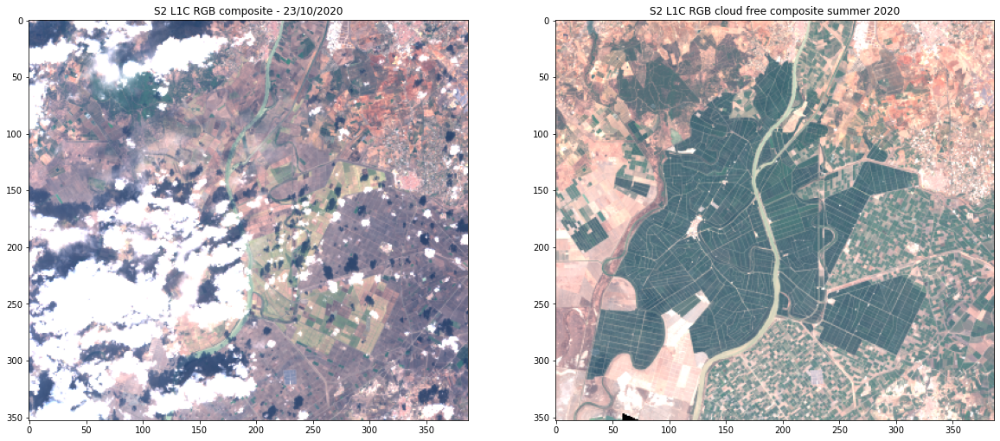

In [22]:
plot_args = {'cmap':'brg'}
fig, ax = plt.subplots(1,2,figsize=(20,10))
ax[0].imshow(im,**plot_args)
ax[0].set_title("S2 L1C RGB composite - 23/10/2020")
im2 = plt.imread("./data/S2_L1C_summer_2020.png")
ax[1].imshow(im2,**plot_args)
ax[1].set_title("S2 L1C RGB cloud free composite summer 2020")
plt.show()

## Mask out the clouds and compute the weekly mean NDVI

This example covers a more complex scenario following this procedure:
1. Load the datacube for the given spatial and temporal extents
2. Remove the clouds
3. Compute the NDVI
4. Resample the data to a weekly base
5. Fill the gaps left from the clouds with a linear interpolation in time
6. Retrieve the weekly NDVI timeseries and visualize it

### Select a point, a rectangle, a polygon or a combination of them using the tools on the left bar.
After running the next cell, an interactive map will show up.
Look at this screenshot for a sample usage:
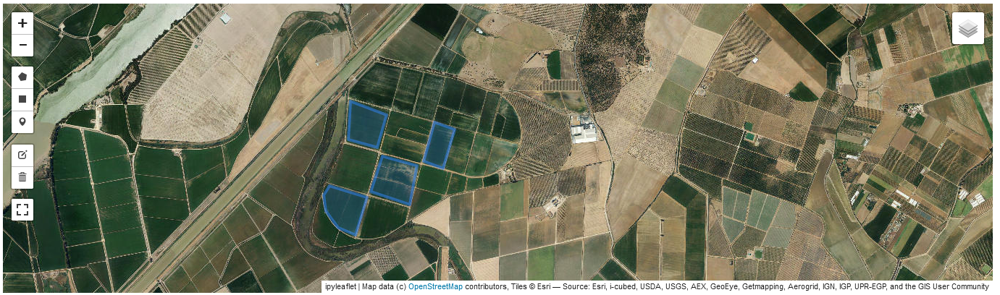

In [6]:
center = [37.2, -6.0]
zoom = 14

eoMap = openeoMap(center,zoom)
eoMap.map

Map(center=[37.2, -6.0], controls=(ZoomControl(options=['position', 'zoom_in_text', 'zoom_in_title', 'zoom_out…

In [51]:
output_folder = "./data"
filename = output_folder + "/field_NDVI.nc"

In [52]:
conn = openeo.connect(openeoHost).authenticate_oidc(client_id="openEO_PKCE")

start = time()

collection      = 'SInCohMap_S2_L1C_T29SQB'
temporal_extent = ['2020-01-01T00:00:00.000Z', '2021-01-01T23:59:00.000Z']
bands = ['B04','B08','FMASK']

S2_L1C = conn.load_collection(collection,temporal_extent=temporal_extent,bands=bands)

# With the next step, we filter outt all the data which is not in the selected polygon
S2_L1C = S2_L1C.filter_spatial(eoMap.feature_collection)


# We create a mask for clouds (FMASK == 4) and cloud shadows (FMASK == 2).
cloud_mask = S2_L1C.filter_bands('FMASK').reduce_dimension(dimension="bands",reducer = lambda value: or_(eq(array_element(value,0),2),eq(array_element(value,0),4)))

# We apply the mask to the RGB bands:
S2_L1C_masked = S2_L1C.filter_bands(['B04','B08']).mask(cloud_mask)

# We compute the NDVI:
nir = S2_L1C_masked.band("B08")
red = S2_L1C_masked.band("B04")

S2_NDVI = nir.normalized_difference(red).add_dimension(name='bands',label='NDVI')

# Create a weekly aggregation
S2_NDVI_weekly = S2_NDVI.aggregate_temporal_period(period="week",reducer="mean")

# Interpolate the missing values in the daily time series
S2_NDVI_weekly_interpolated = S2_NDVI_weekly.apply_dimension(process=lambda data: data.array_interpolate_linear(), dimension="DATE")

# Download the result as a netCDF with the given filename
S2_NDVI_weekly_interpolated.download(filename,format="netCDF")

print("Elapsed time: ", time() - start)
print("Result saved to: ",filename)

Authenticated using refresh token.
Elapsed time:  20.16255259513855
Result saved to:  ./data/field_NDVI.nc


In [53]:
ndvi_data = xr.open_dataarray(filename).to_dataset(dim='variable')
ndvi_data

<xarray.Dataset>
Dimensions:      (time: 52, x: 135, y: 140)
Coordinates:
  * time         (time) datetime64[ns] 2020-01-05 2020-01-12 ... 2020-12-27
    spatial_ref  int64 ...
  * y            (y) float64 4.122e+06 4.122e+06 ... 4.121e+06 4.121e+06
  * x            (x) float64 7.615e+05 7.615e+05 ... 7.628e+05 7.628e+05
Data variables:
    NDVI         (time, y, x) float32 ...

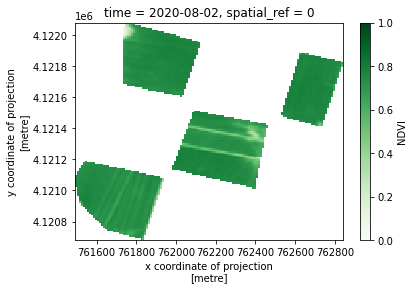

In [3]:
ndvi_data.NDVI[30].plot.imshow(cmap='Greens',vmin=0,vmax=1)

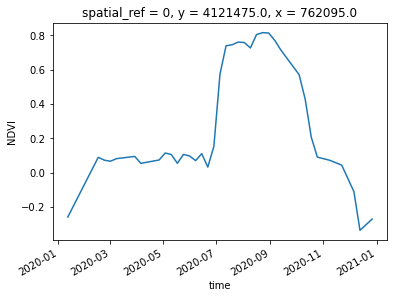

In [5]:
ndvi_data.NDVI[:,60,60].plot()